<a href="https://colab.research.google.com/github/Quachday/DeepLearningForCoders/blob/main/Chapter_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install bing-image-downloader

In [ ]:
from bing_image_downloader import downloader

In [ ]:
from pathlib import Path

sample_data/


In [ ]:
downloader.download("grizzly bear", limit=150, output_dir='bears', adult_filter_off=True, force_replace=False, timeout=5)
downloader.download("black bear", limit=150, output_dir='bears', adult_filter_off=True, force_replace=False, timeout=5)
downloader.download("teddy bear", limit=150, output_dir='bears', adult_filter_off=True, force_replace=False, timeout=5)


[%] Downloading Images to /content/bears/grizzly bear


[!!]Indexing page: 1

[%] Indexed 35 Images on Page 1.


[%] Downloading Image #1 from https://www.publicdomainpictures.net/pictures/240000/velka/grizzly-bear-portrait-1511961987XRY.jpg
[%] File Downloaded !

[%] Downloading Image #2 from https://thelatebloomerhiker.files.wordpress.com/2014/11/grizzly-bear-22224-1920x1200.jpg
[%] File Downloaded !

[%] Downloading Image #3 from https://tetonvalleylodge.com/wp-content/uploads/2015/04/grizzly-bear-idaho.jpg
[Error]Invalid image, not saving https://tetonvalleylodge.com/wp-content/uploads/2015/04/grizzly-bear-idaho.jpg

[!] Issue getting: https://tetonvalleylodge.com/wp-content/uploads/2015/04/grizzly-bear-idaho.jpg
[!] Error:: Invalid image, not saving https://tetonvalleylodge.com/wp-content/uploads/2015/04/grizzly-bear-idaho.jpg

[%] Downloading Image #3 from http://4.bp.blogspot.com/-3WcCGQ1bzJI/UXcshw5QEwI/AAAAAAAAIns/gfJpUVE0FK8/s1600/Grizzly-Bear-7.jpg
[%] File Downloaded !

[%]

FileNotFoundError: [Errno 2] No such file or directory: 'grizzly bear' -> 'grizzly'

In [ ]:
path = Path("grizzly")
path.rename("bears/grizzly")
path = Path("black")
path.rename("bears/black")
path = Path("teddy")
path.rename("bears/teddy")

Path('bears/teddy')

In [ ]:
import fastai

In [ ]:
from fastai.vision.all import *

In [ ]:
bears = DataBlock(
blocks=(ImageBlock, CategoryBlock),
get_items=get_image_files,
splitter=RandomSplitter(valid_pct=0.2, seed=42),
get_y=parent_label,
item_tfms=Resize(128))

In [ ]:
dls = bears.dataloaders("bears")

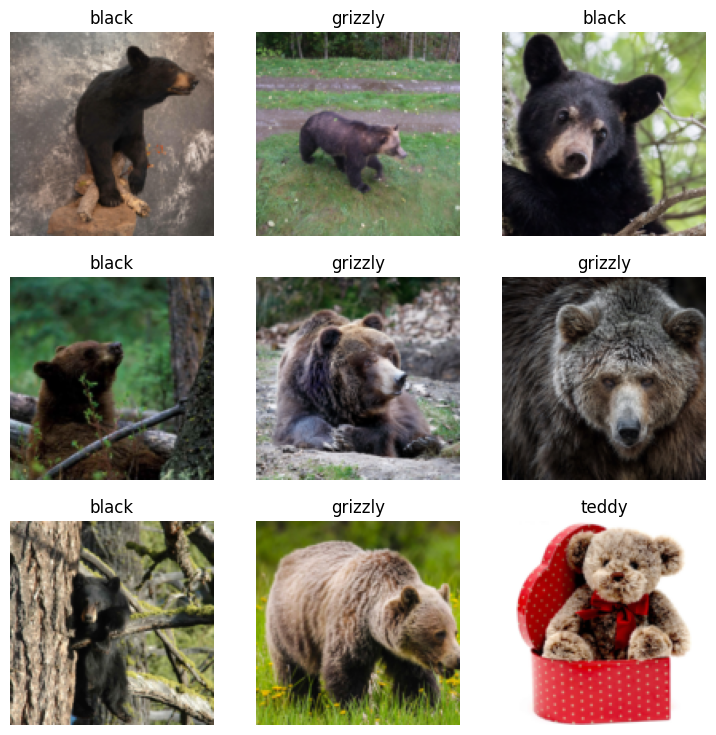

In [ ]:
dls.valid.show_batch()

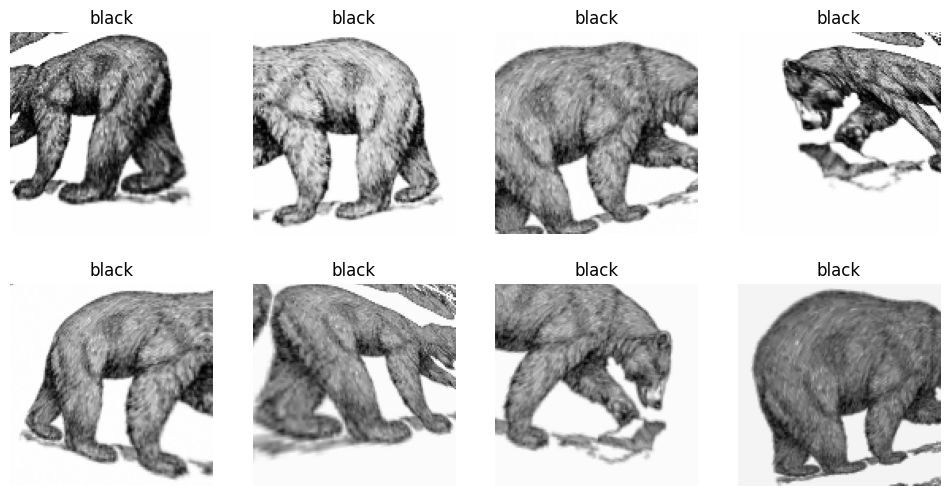

In [ ]:
bears = bears.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = bears.dataloaders("bears")
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [ ]:
bears = bears.new(
item_tfms=RandomResizedCrop(224, min_scale=0.5),
batch_tfms=aug_transforms())
dls = bears.dataloaders("bears")

In [ ]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:01<00:00, 35.7MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.697464,1.503738,0.488889,00:39


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,time
0,0.881817,0.858631,0.333333,00:54
1,0.672075,0.496155,0.088889,00:49
2,0.528187,0.380167,0.066667,00:48
3,0.446417,0.359317,0.044444,00:50


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


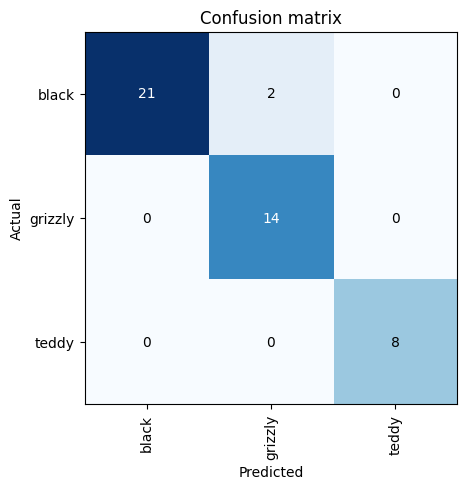

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

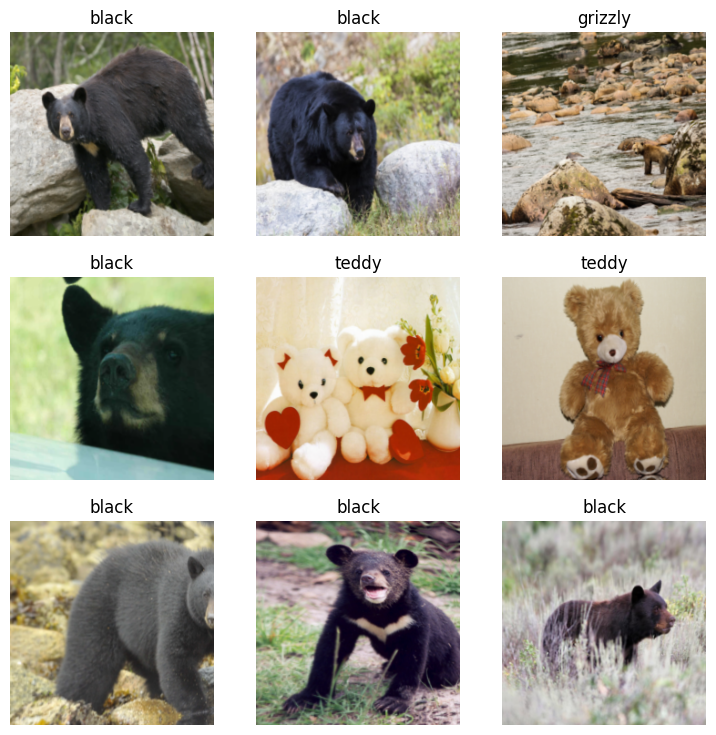

In [ ]:
dls.train.show_batch()

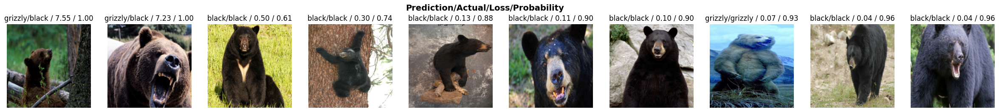

In [ ]:
interp.plot_top_losses(10, nrows=1)

In [ ]:
from fastai.vision.widgets import *

In [ ]:
cleaner = ImageClassifierCleaner(learn)

In [ ]:
cleaner #GUI for cleaning

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()   #Delete
#for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat) # -> To relabel

In [ ]:
cleaner


In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()   #Delete

In [ ]:
#After cleaning -> see accuracy improve
dls = bears.dataloaders("bears")
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.864775,1.376247,0.454545,00:41


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,time
0,0.858375,0.480825,0.204545,00:49
1,0.645163,0.176676,0.090909,00:49
2,0.521254,0.165191,0.068182,00:48
3,0.436144,0.182615,0.068182,00:48


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


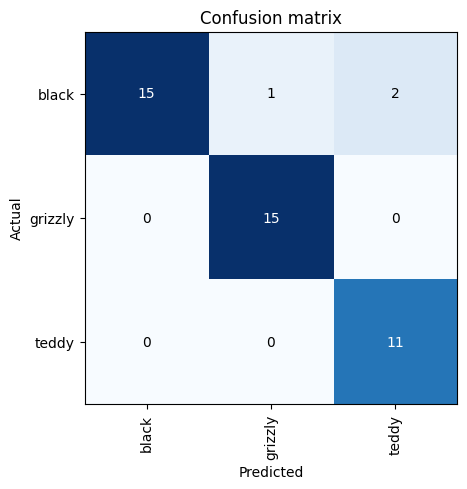

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix() #wrong more :)))

Deploy (Infer)

In [ ]:
learn.export()

In [ ]:
path = Path()

In [ ]:
path

Path('.')

In [ ]:
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [ ]:
learn_inf = load_learner(path/'export.pkl')

In [ ]:
learn_inf.predict('/content/Images/black.jpg')

('black', tensor(0), tensor([0.8239, 0.1658, 0.0103]))

In [ ]:
learn_inf.dls.vocab

['black', 'grizzly', 'teddy']

In [ ]:
btn_upload = widgets.FileUpload()

In [ ]:
btn_upload

FileUpload(value={}, description='Upload')

In [ ]:
img = PILImage.create(btn_upload.data[-1])

In [ ]:
out_pl = widgets.Output()

In [ ]:
out_pl.clear_output()

In [ ]:
with out_pl: display(img.to_thumb(128,128))

In [ ]:
out_pl

Output()

In [ ]:
pred,pred_idx,probs = learn_inf.predict(img)

In [ ]:
lbl_pred = widgets.Label()

In [ ]:
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

In [ ]:
lbl_pred

Label(value='Prediction: black; Probability: 0.8239')

In [ ]:
btn_run = widgets.Button(description='Classify')

In [ ]:
btn_run

Button(description='Classify', style=ButtonStyle())

In [ ]:
def on_click_classify(change):
  img = PILImage.create(btn_upload.data[0])
  out_pl.clear_output()
  with out_pl: display(img.to_thumb(128,128))
  pred,pred_idx,probs = learn_inf.predict(img)
  lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

In [ ]:
btn_run.on_click(on_click_classify)

In [ ]:
btn_run

Button(description='Classify', style=ButtonStyle())

In [ ]:
VBox([widgets.Label('Select your bear!'),
btn_upload, btn_run, out_pl, lbl_pred])

In [ ]:
!pip install voila
!jupyter serverextension enable voila --sys-prefix

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.9/105.9 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.2/383.2 kB 18.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.0/59.0 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.1/73.1 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 15.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 52.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 9.0 MB/s eta 0:00:00
  Attempting uninstall: pyzmq
    Found existing installation: pyzmq 23.2.1
    Uninstalling pyzmq-23.2.1:
      Successfully uninstalled pyzmq-23.2.1
  Attempting uninstall: jupyter-client
    Found existing installation: jupyter-client 6.1.12
    Uninstalling jupyter-client-6.1.12:
      Successfully uninstalled jupyter-client-6.1.12
  Attempting uni

Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
      voila 0.5.5 OK
